In [ ]:
!pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d muhammadhananasghar/human-emotions-datasethes
!unzip "/content/human-emotions-datasethes.zip" -d "/content/dataset/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/EmotionsDataset/data/nothing/720.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/721.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/722.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/723.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/724.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/725.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/726.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/727.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/728.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/729.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/73.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/730.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/731.jpg  
  inflating: /content/dataset/EmotionsDataset/data/no

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, InputLayer, BatchNormalization, Input, Dropout, RandomFlip, RandomRotation, Resizing, Rescaling
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import BinaryAccuracy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives, Precision, Recall, AUC, binary_accuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback, CSVLogger, EarlyStopping, LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers  import L2, L1
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import tensorflow_probability as tfp


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory

In [ ]:
train_img=image_dataset_from_directory(
    "/content/dataset/EmotionsDataset_Splitted/data/train",
     color_mode="rgb",
    image_size=(256,256),
    batch_size=32,
    label_mode="categorical",
    shuffle=True,
    seed=42,


)


test_img=image_dataset_from_directory(
    "/content/dataset/EmotionsDataset_Splitted/data/test",
    color_mode="rgb",


    image_size=(256,256),
    batch_size=32,
    label_mode="categorical",
    shuffle=True,
    seed=42,

)


In [ ]:
import numpy as np
class_names=train_img.class_names
class_names

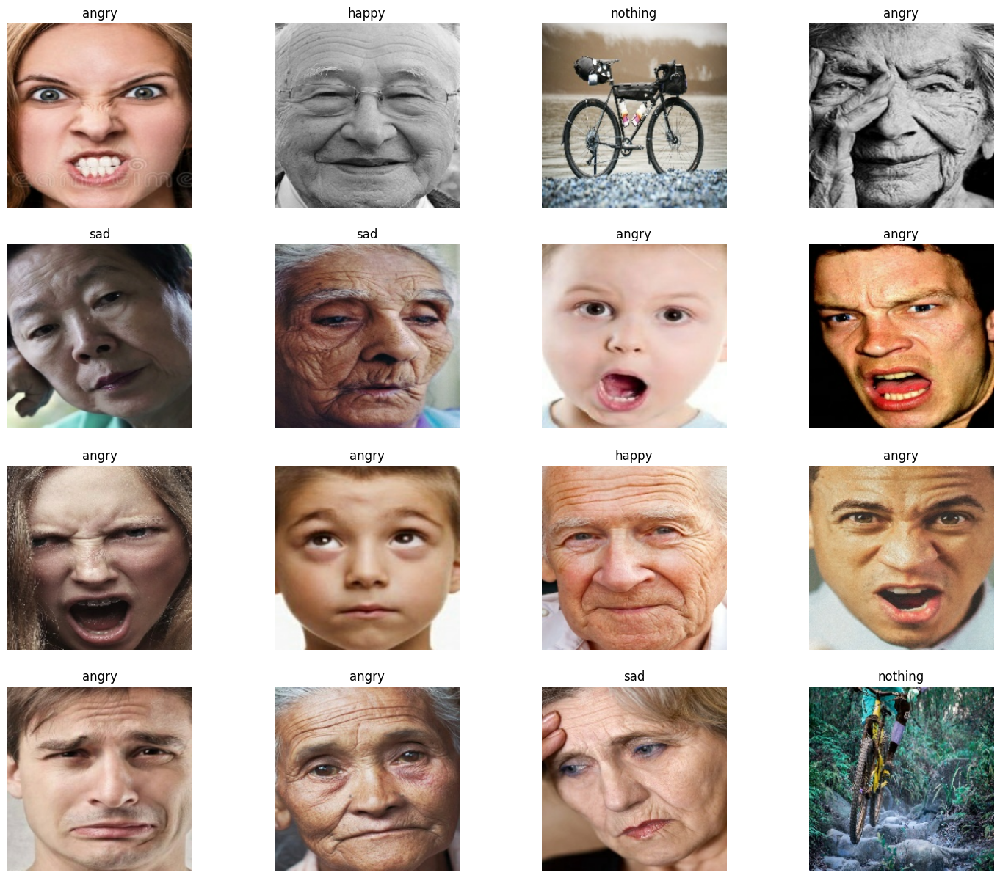

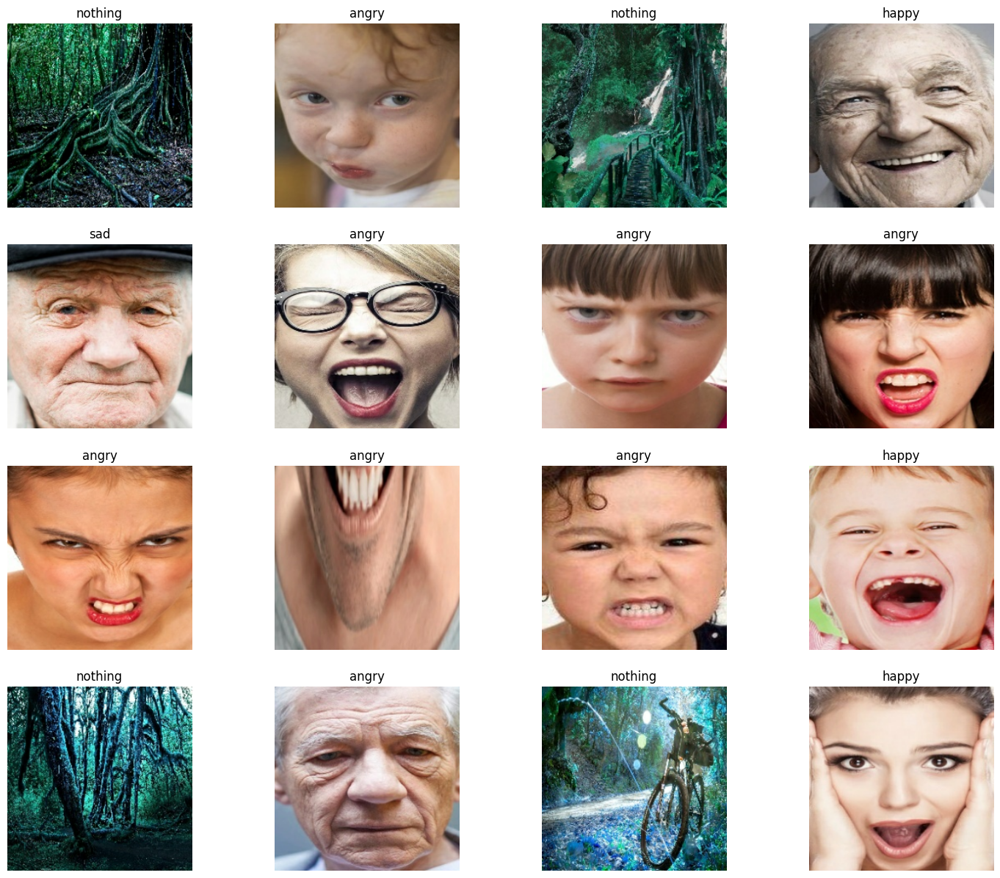

In [ ]:
for img,labels in train_img.take(2):
  plt.figure(figsize=(18,15))
  for i in range(16):
    plt.subplot(4,4,i+1)
    plt.imshow(img[i].numpy().astype("uint32"))
    plt.axis("off")
    # print(np.argamax(labels[i]))
    plt.title(class_names[np.argmax(labels[i])])


In [ ]:
pip install wandb

In [ ]:
import tensorflow as tf
class LeNet:
    def __init__(self,filter):
        self.conv1 = Conv2D(filter, 5)
        self.pool1 = tf.keras.layers.MaxPooling2D(2)
        self.conv2 = Conv2D(16, 5)
        self.pool2 =tf.keras.layers.MaxPooling2D(2)
        self.flatten = Flatten()
        self.dense1 = Dense(120, activation='relu')
        self.dense2 = Dense(84, activation='relu')
        self.dense3 = Dense(3, activation='softmax')

    def __call__(self, input):
        x = self.conv1(input)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dense2(x)
        x = self.dense3(x)
        return x


In [ ]:
model = LeNet(6)
y=tf.keras.layers.Input(shape=(256,256,3))
x=model(y)







In [ ]:
lenet_model_func = Model(y, x, name = "Lenet_Model")

In [ ]:

class NeuralearnDense(Layer):
  def __init__(self, output_units, activation):
    super(NeuralearnDense, self).__init__()
    self.output_units = output_units
    self.activation = activation

  def build(self, input_features_shape):
    self.w = self.add_weight(shape = (input_features_shape[-1], self.output_units), initializer = "random_normal", trainable = True)
    self.b = self.add_weight(shape = (self.output_units,), initializer = "random_normal", trainable = True)

  def call(self, input_features):

    pre_output = tf.matmul(input_features, self.w) + self.b

    if(self.activation == "relu"):
      return tf.nn.relu(pre_output)

    elif(self.activation == "sigmoid"):
      return tf.math.sigmoid(pre_output)

    else:
      return pre_output

In [ ]:
def NeuralearnDense(Layer):
  def __init__(self,output_units,activation):
    super(NeuralearnDense,self).__init__()
    self.output_units=output_units
    self.activation=activation


  def build(self,input_features_shape):
    self.w=self.add_weight(shape=(input_features_shape[-1],self.output_units),initializer="random_normal",trainable=True)
    self.b=self.add_weight(shape=(self.output_units,),initializer="random_normal",trainable=True)


  def call(self,input_features):
    pre_output=tf.matmul(input_features,self.w)+self.b

    if self.activation=="relu":
      return tf.nn.relu(pre_output)

    elif self.activation=="sigmoid":
      return tf.math.sigmoid(pre_output)

    else:
      return pre_output







In [ ]:

IM_SIZE = 224
lenet_custom_model = tf.keras.Sequential([
                             InputLayer(input_shape = (IM_SIZE, IM_SIZE, 3)),

                             Conv2D(filters = 6, kernel_size = 3, strides=1, padding='valid', activation = 'relu'),
                             BatchNormalization(),
                             MaxPool2D (pool_size = 2, strides= 2),

                             Conv2D(filters = 16, kernel_size = 3, strides=1, padding='valid', activation = 'relu'),
                             BatchNormalization(),
                             MaxPool2D (pool_size = 2, strides= 2),

                             Flatten(),

                             Dense(100,  "relu"),
                             BatchNormalization(),

                             Dense(10, "relu"),
                             BatchNormalization(),

                             Dense(1, "sigmoid"),

])

In [ ]:
lenet_model_func.summary()

Model: "Lenet_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_27 (Conv2D)          (None, 252, 252, 6)       456       
                                                                 
 max_pooling2d_26 (MaxPooli  (None, 126, 126, 6)       0         
 ng2D)                                                           
                                                                 
 conv2d_28 (Conv2D)          (None, 122, 122, 16)      2416      
                                                                 
 max_pooling2d_27 (MaxPooli  (None, 61, 61, 16)        0         
 ng2D)                                                           
                                                                 
 flatten_13 (Flatten)        (None, 59536)             

In [ ]:
# prompt: fit the model

model.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    metrics=['accuracy']
)

history = model.fit(
    train_img,
    validation_data=test_img,
    epochs=5
)


AttributeError: 'LeNet' object has no attribute 'compile'

AttributeError: 'LeNet' object has no attribute 'compile'

In [ ]:
import tensorflow as tf
lam=0.37
rx=tf.cast(tfp.distributions.Uniform(0, 256).sample(1)[0],tf.int32)
ry=tf.cast(tfp.distributions.Uniform(0, 256).sample(1)[0],tf.int32)

rw=tf.cast(256*tf.math.sqrt(1-lam),tf.int32)
rh=tf.cast(256*tf.math.sqrt(1-lam),tf.int32)

rx=tf.clip_by_value(rx-rw//2,0,255)
ry=tf.clip_by_value(ry-rh//2,0,255)

rx_t=tf.clip_by_value(rx+rw//2,0,255)
ry_t=tf.clip_by_value(ry+rh//2,0,255)


rw=rx_t-rx
if rw==0:
  rw=1
rh=ry_t-ry
if rh==0:
  rh=1

rx,ry,rw,rh



(<tf.Tensor: shape=(), dtype=int32, numpy=0>,
 <tf.Tensor: shape=(), dtype=int32, numpy=103>,
 <tf.Tensor: shape=(), dtype=int32, numpy=101>,
 <tf.Tensor: shape=(), dtype=int32, numpy=101>)

In [ ]:
def box(lam):
  rx=tf.cast(tfp.distributions.Uniform(0,256).sample(1)[0],tf.int32)
  ry=tf.cast(tfp.distributions.Uniform(0,256).sample(1)[0],tf.int32)

  rw=tf.cast(256*tf.math.sqrt(1-lam),tf.int32)
  rh=tf.cast(256*tf.math.sqrt(1-lam),tf.int32)

  rx=tf.clip_by_value(rx-rw//2,0,255)
  ry=tf.clip_by_value(ry-rh//2,0,255)

  rx_t=tf.clip_by_value(rx+rw//2,0,255)
  ry_t=tf.clip_by_value(ry+rh//2,0,255)

  rw=rx_t-rx
  if rw==0:
    rw=1
  rh=ry_t-ry
  if rh==0:
    rh=1


  return rx,ry,rw,rh


In [ ]:
box(0.34)

(<tf.Tensor: shape=(), dtype=int32, numpy=113>,
 <tf.Tensor: shape=(), dtype=int32, numpy=3>,
 <tf.Tensor: shape=(), dtype=int32, numpy=103>,
 <tf.Tensor: shape=(), dtype=int32, numpy=103>)

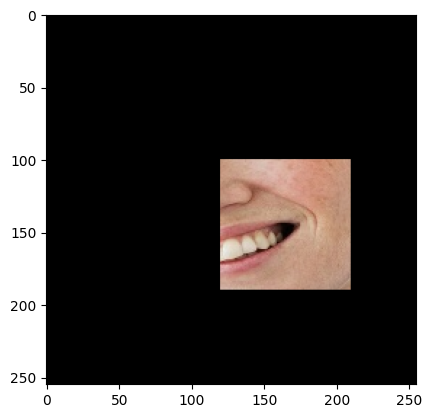

In [ ]:
for img,label in train_img:
  crp_img=tf.image.crop_to_bounding_box(img,100,120,90,90)
  pad_img=tf.image.pad_to_bounding_box(crp_img,100,120,255,255)
  plt.imshow(pad_img[0].numpy().astype("uint32"))

  break

In [ ]:
def cutmix(train_img1,train_img2):

  (img1,lab1),(img2,lab2)=train_img1,train_img2
  lam=tfp.distributions.Beta(0.3,0.3).sample(1)[0]
  rx,ry,rw,rh=box(lam)
  crp_img1=tf.image.crop_to_bounding_box(img1,ry,rx,rh,rw)
  pad_img1=tf.image.pad_to_bounding_box(crp_img1,rx,ry,256,256)

  crp_img2=tf.image.crop_to_bounding_box(img2,ry,rx,rh,rw)
  pad_img2=tf.image.pad_to_bounding_box(crp_img2,rx,ry,256,256)
  image=img1-pad_img1+pad_img2

  lamda=tf.cast(1-((rw*rh)/(256*256)),tf.float32)

  label=lamda*lab1+(1-lamda)*lab2
  return image,label






In [ ]:
aug_layer=tf.keras.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.2),
        tf.keras.layers.RandomContrast(0.2)
    ]
)

def augment(image,label):
  return aug_layer(image,training=False),label

In [ ]:
train_dataset1=train_img.map(augment,num_parallel_calls=tf.data.AUTOTUNE)
train_dataset2=train_img.map(augment,num_parallel_calls=tf.data.AUTOTUNE)
train_data=tf.data.Dataset.zip((train_dataset1,train_dataset2))
train_data=train_data.map(cutmix,num_parallel_calls=tf.data.AUTOTUNE)
train_data

<_ParallelMapDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 4), dtype=tf.float32, name=None))>

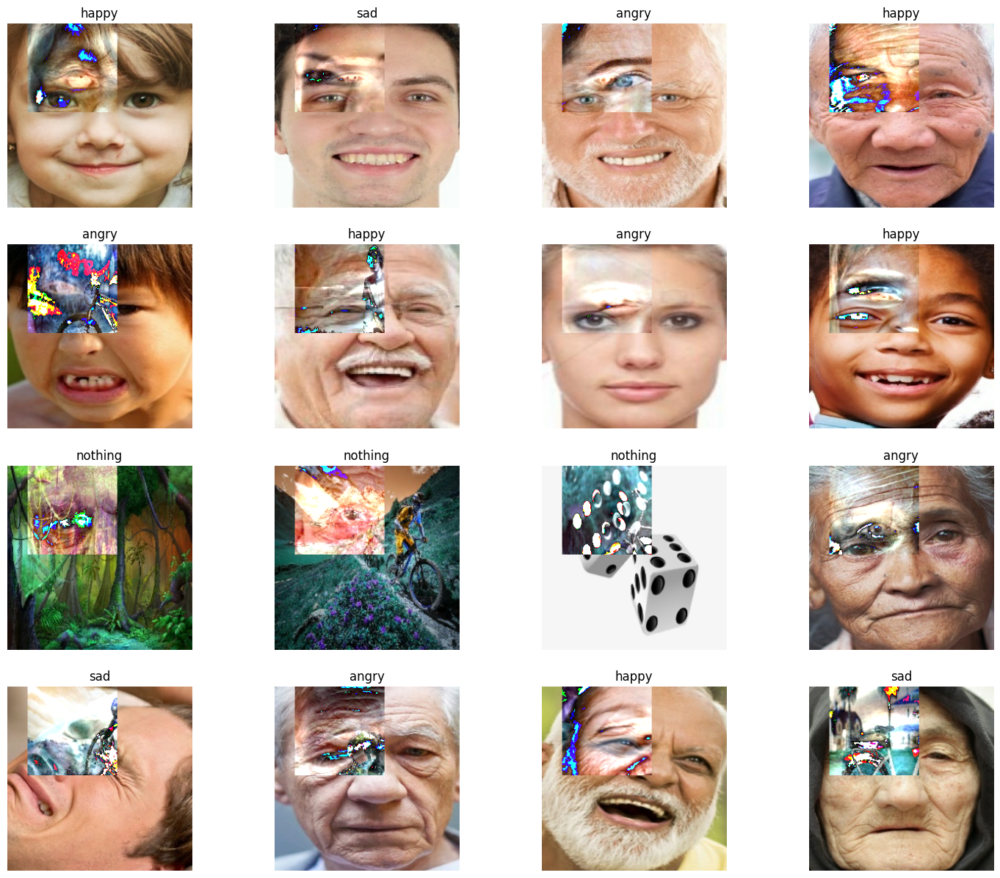

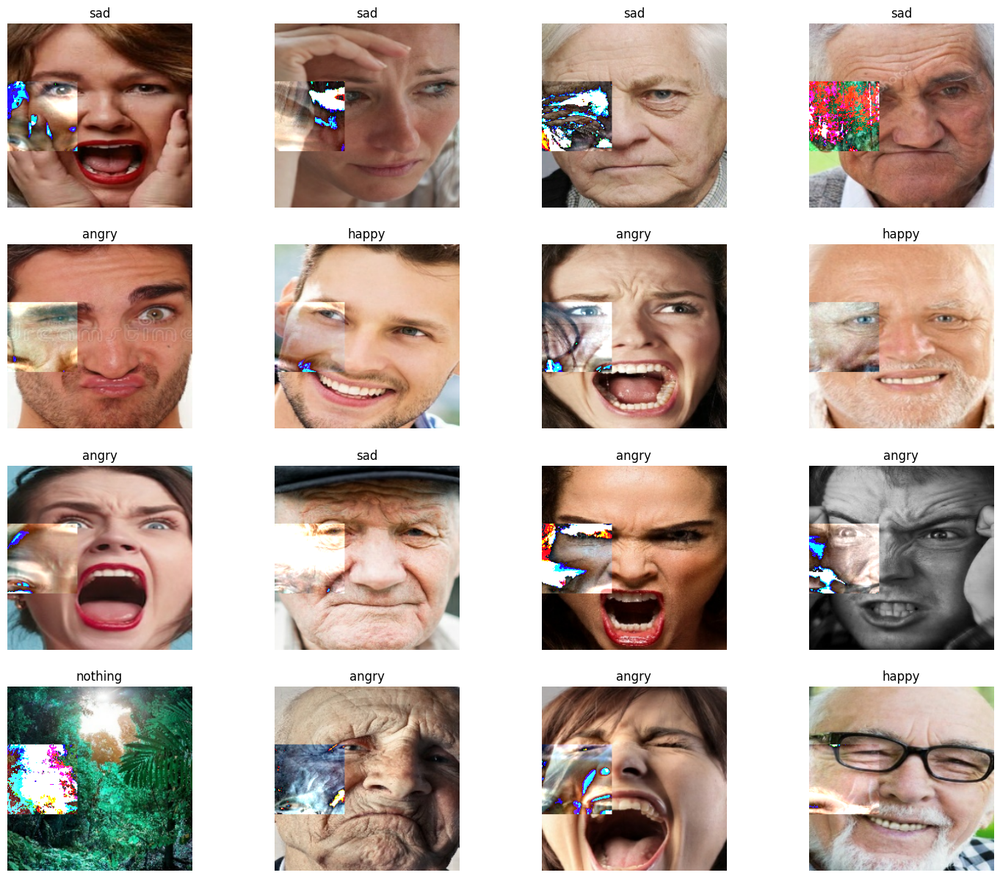

In [ ]:
for img,labels in train_data.take(2):
  plt.figure(figsize=(18,15))
  for i in range(16):
    plt.subplot(4,4,i+1)
    plt.imshow(img[i].numpy().astype("uint32"))
    plt.axis("off")
    # print(np.argamax(labels[i]))
    plt.title(class_names[np.argmax(labels[i])])

In [ ]:
train_img_=train_img.map(augment,num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)
val_img_=test_img.prefetch(tf.data.AUTOTUNE)


In [ ]:
lenet_model=tf.keras.Sequential([
    tf.keras.layers.Conv2D(6,3,activation="relu",strides=(2,2),input_shape=(256,256,3),padding="valid",
                           kernel_regularizer=L2(0.001)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2),strides=(4,4)),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Conv2D(16,3,activation="relu",padding="valid",strides=(2,2),kernel_regularizer=L2(0.001)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2),strides=(4,4)),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Flatten(),


    tf.keras.layers.Dense(120,activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(84,activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(4,activation="softmax")





])

In [ ]:
lenet_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 127, 127, 6)       168       
                                                                 
 batch_normalization_1 (Bat  (None, 127, 127, 6)       24        
 chNormalization)                                                
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 6)         0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 32, 32, 6)         0         
                                                                 
 conv2d_2 (Conv2D)           (None, 15, 15, 16)        880       
                                                                 
 batch_normalization_2 (Bat  (None, 15, 15, 16)       

In [ ]:


from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=7,
    restore_best_weights=True,
)
model_checkpoint = ModelCheckpoint(
    filepath="best_model.h5",
    monitor="val_loss",
    save_best_only=True,
)


In [ ]:
# prompt: import all the metrics and intialize it

from tensorflow.keras.metrics import BinaryAccuracy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives, Precision, Recall, AUC, binary_accuracy

metrics = [TruePositives(name='tp'),FalsePositives(name='fp'), TrueNegatives(name='tn'), FalseNegatives(name='fn'),
            BinaryAccuracy(name='accuracy'), Precision(name='precision'), Recall(name='recall'), AUC(name='auc')]



In [ ]:
lenet_model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="categorical_crossentropy",
    metrics=[accuracy,precision,recall,auc]
)


In [ ]:
hist=lenet_model.fit(train_img_,validation_data=val_img_,epochs=30,verbose=1,callbacks=[model_checkpoint,early_stopping])

Epoch 1/30
99/99 [==============================] - 48s 478ms/step - loss: 0.7990 - accuracy: 0.8277 - precision: 0.7239 - recall: 0.5025 - auc: 0.8827 - val_loss: 0.7312 - val_accuracy: 0.8493 - val_precision: 0.8149 - val_recall: 0.5140 - val_auc: 0.9060
Epoch 2/30


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


99/99 [==============================] - 47s 458ms/step - loss: 0.7791 - accuracy: 0.8339 - precision: 0.7433 - recall: 0.5127 - auc: 0.8883 - val_loss: 0.7341 - val_accuracy: 0.8477 - val_precision: 0.8277 - val_recall: 0.4937 - val_auc: 0.9063
Epoch 3/30
99/99 [==============================] - 59s 590ms/step - loss: 0.7793 - accuracy: 0.8333 - precision: 0.7361 - recall: 0.5194 - auc: 0.8886 - val_loss: 0.7219 - val_accuracy: 0.8490 - val_precision: 0.8264 - val_recall: 0.5013 - val_auc: 0.9083
Epoch 4/30
99/99 [==============================] - 49s 489ms/step - loss: 0.7487 - accuracy: 0.8406 - precision: 0.7558 - recall: 0.5352 - auc: 0.8982 - val_loss: 0.7357 - val_accuracy: 0.8503 - val_precision: 0.8264 - val_recall: 0.5076 - val_auc: 0.9064
Epoch 5/30
99/99 [==============================] - 49s 493ms/step - loss: 0.7486 - accuracy: 0.8423 - precision: 0.7566 - recall: 0.5444 - auc: 0.8986 - val_loss: 0.7503 - val_accuracy: 0.8490 - val_precision: 0.7977 - val_recall: 0.5305 -

In [ ]:
hist.history

{'loss': [0.7989651560783386,
  0.7791352868080139,
  0.7792531847953796,
  0.7486602663993835,
  0.7485595345497131,
  0.7555314302444458,
  0.7213038802146912,
  0.7405118346214294,
  0.7037603855133057,
  0.7134953737258911,
  0.7203901410102844,
  0.6945753693580627,
  0.7041551470756531,
  0.7079061269760132,
  0.6678050756454468,
  0.6789281368255615,
  0.684074878692627,
  0.6787213683128357,
  0.6705437898635864,
  0.6539461612701416,
  0.6474174857139587,
  0.6505449414253235],
 'accuracy': [0.8277284502983093,
  0.8339149951934814,
  0.8332804441452026,
  0.8405774235725403,
  0.8423223495483398,
  0.8439086079597473,
  0.846367359161377,
  0.8427188992500305,
  0.8493020534515381,
  0.8490641117095947,
  0.8505710363388062,
  0.8515228629112244,
  0.8504917621612549,
  0.8479536771774292,
  0.8571541905403137,
  0.8558851480484009,
  0.8588197827339172,
  0.8554092645645142,
  0.859295666217804,
  0.8613578677177429,
  0.864133894443512,
  0.8624683022499084],
 'precision': 

Text(0.5, 1.0, 'model_recall')

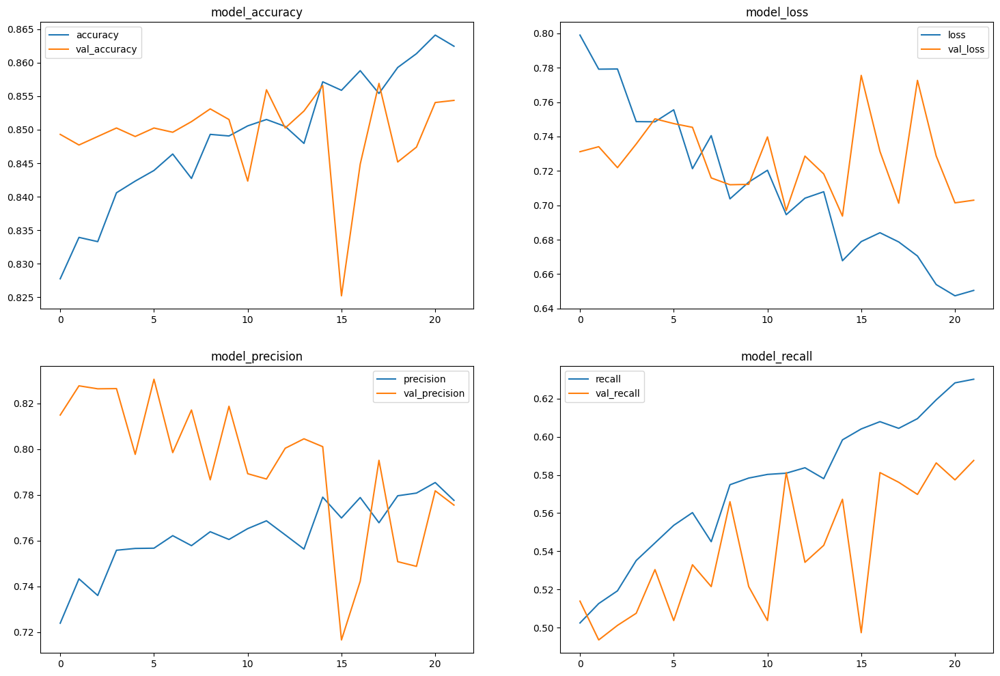

In [ ]:
plt.figure(figsize=(18,12))
plt.subplot(2,2,1)
plt.plot(hist.history['accuracy'],label="accuracy")
plt.plot(hist.history['val_accuracy'],label="val_accuracy")
plt.legend()
plt.title("model_accuracy")
plt.subplot(2,2,2)
plt.plot(hist.history['loss'],label="loss")
plt.plot(hist.history['val_loss'],label="val_loss")
plt.legend()
plt.title("model_loss")
plt.subplot(2,2,3)
plt.plot(hist.history['precision'],label="precision")
plt.plot(hist.history['val_precision'],label="val_precision")
plt.legend()
plt.title("model_precision")
plt.subplot(2,2,4)
plt.plot(hist.history['recall'],label="recall")
plt.plot(hist.history['val_recall'],label="val_recall")
plt.legend()
plt.title("model_recall")

In [ ]:
from tensorflow.keras.applications.efficientnet import EfficientNetB4
eff=EfficientNetB4(include_top=False,input_shape=(256,256,3),weights="imagenet")

for layers in eff.layers:
  layers.trainable=False
x=eff.output
x=tf.keras.layers.GlobalAveragePooling2D()(x)
x=tf.keras.layers.Dropout(0.2)(x)
x=tf.keras.layers.Dense(120,activation="relu")(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.Dense(84,activation="relu")(x)
x=tf.keras.layers.Dense(4,activation="softmax")(x)
pre_effnet=Model(eff.input,x)
pre_effnet.summary()



Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling_4 (Rescaling)     (None, 256, 256, 3)          0         ['input_3[0][0]']             
                                                                                                  
 normalization_2 (Normaliza  (None, 256, 256, 3)          7         ['rescaling_4[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_5 (Rescaling)     (None, 256, 256, 3)          0         ['normalization_2[0][0]'

In [ ]:
metrics = [TruePositives(name='tp'),FalsePositives(name='fp'), TrueNegatives(name='tn'), FalseNegatives(name='fn'),
            BinaryAccuracy(name='accuracy'), Precision(name='precision'), Recall(name='recall'), AUC(name='auc')]

In [ ]:
pre_effnet.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="cateagroical_crossentropy",
    metrics=metrics
)

In [ ]:
hist=lenet_model.fit(train_img_,validation_data=val_img_,epochs=30,verbose=1,callbacks=[model_checkpoint,early_stopping])

Epoch 1/30
99/99 [==============================] - 33s 330ms/step - loss: 0.6783 - accuracy: 0.8538 - precision: 0.7697 - recall: 0.5926 - auc: 0.9172 - val_loss: 0.7156 - val_accuracy: 0.8496 - val_precision: 0.7784 - val_recall: 0.5571 - val_auc: 0.9060
Epoch 2/30
99/99 [==============================] - 32s 316ms/step - loss: 0.6712 - accuracy: 0.8574 - precision: 0.7723 - recall: 0.6091 - auc: 0.9204 - val_loss: 0.7480 - val_accuracy: 0.8414 - val_precision: 0.7738 - val_recall: 0.5165 - val_auc: 0.8940
Epoch 3/30
99/99 [==============================] - 31s 306ms/step - loss: 0.6771 - accuracy: 0.8568 - precision: 0.7719 - recall: 0.6066 - auc: 0.9179 - val_loss: 0.7081 - val_accuracy: 0.8512 - val_precision: 0.7672 - val_recall: 0.5812 - val_auc: 0.9075
Epoch 4/30
99/99 [==============================] - 31s 305ms/step - loss: 0.6666 - accuracy: 0.8621 - precision: 0.7845 - recall: 0.6180 - auc: 0.9208 - val_loss: 0.7117 - val_accuracy: 0.8503 - val_precision: 0.7590 - val_recal

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 14/30
99/99 [==============================] - 31s 313ms/step - loss: 0.6207 - accuracy: 0.8689 - precision: 0.7866 - recall: 0.6526 - auc: 0.9321 - val_loss: 0.6951 - val_accuracy: 0.8591 - val_precision: 0.7748 - val_recall: 0.6155 - val_auc: 0.9127
Epoch 15/30
99/99 [==============================] - 33s 330ms/step - loss: 0.5931 - accuracy: 0.8768 - precision: 0.8009 - recall: 0.6751 - auc: 0.9384 - val_loss: 0.7063 - val_accuracy: 0.8503 - val_precision: 0.7532 - val_recall: 0.5964 - val_auc: 0.9078
Epoch 16/30
99/99 [==============================] - 33s 329ms/step - loss: 0.6032 - accuracy: 0.8744 - precision: 0.7968 - recall: 0.6681 - auc: 0.9355 - val_loss: 0.7225 - val_accuracy: 0.8449 - val_precision: 0.7530 - val_recall: 0.5647 - val_auc: 0.9021
Epoch 17/30
99/99 [==============================] - 33s 329ms/step - loss: 0.5922 - accuracy: 0.8775 - precision: 0.8050 - recall: 0.6732 - auc: 0.9383 - val_loss: 0.7004 - val_accuracy: 0.8569 - val_precision: 0.7637 - val_r

In [ ]:
hist.history

{'loss': [0.678290843963623,
  0.6711876392364502,
  0.677132248878479,
  0.666597306728363,
  0.6619747281074524,
  0.6432602405548096,
  0.6376798748970032,
  0.6457377672195435,
  0.6269333958625793,
  0.6312239766120911,
  0.6388157606124878,
  0.6309568881988525,
  0.6163120269775391,
  0.6207459568977356,
  0.5931124091148376,
  0.6032084822654724,
  0.592154860496521,
  0.6112186908721924,
  0.6014764308929443,
  0.6045147180557251],
 'accuracy': [0.8538229465484619,
  0.8573921322822571,
  0.8568369150161743,
  0.862071692943573,
  0.8565196990966797,
  0.8649270534515381,
  0.8661960363388062,
  0.8623096346855164,
  0.8677030205726624,
  0.8676237463951111,
  0.864847719669342,
  0.8692893385887146,
  0.8734930157661438,
  0.8688927888870239,
  0.8768242597579956,
  0.8744447827339172,
  0.8775380849838257,
  0.8735723495483398,
  0.874920666217804,
  0.8735723495483398],
 'precision': [0.7696744799613953,
  0.7723250389099121,
  0.7719014883041382,
  0.7845348119735718,
  0.

Text(0.5, 1.0, 'model_recall')

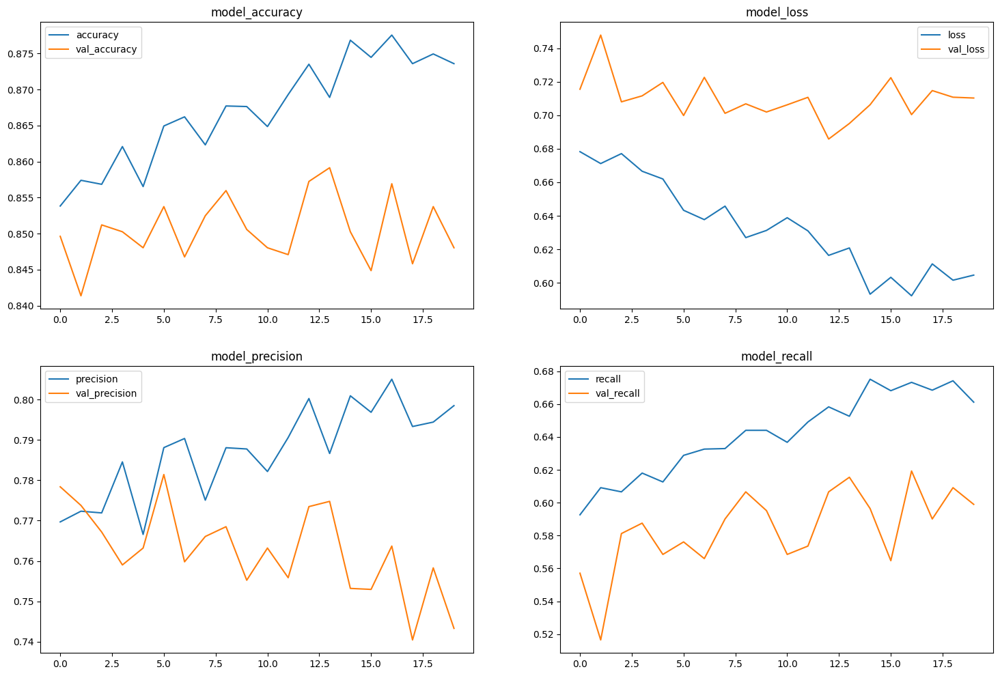

In [ ]:


plt.figure(figsize=(18,12))
plt.subplot(2,2,1)
plt.plot(hist.history['accuracy'],label="accuracy")
plt.plot(hist.history['val_accuracy'],label="val_accuracy")
plt.legend()
plt.title("model_accuracy")
plt.subplot(2,2,2)
plt.plot(hist.history['loss'],label="loss")
plt.plot(hist.history['val_loss'],label="val_loss")
plt.legend()
plt.title("model_loss")
plt.subplot(2,2,3)
plt.plot(hist.history['precision'],label="precision")
plt.plot(hist.history['val_precision'],label="val_precision")
plt.legend()
plt.title("model_precision")
plt.subplot(2,2,4)
plt.plot(hist.history['recall'],label="recall")
plt.plot(hist.history['val_recall'],label="val_recall")
plt.legend()
plt.title("model_recall")

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
res=ResNet50(include_top=False,input_shape=(256,256,3))

for layers in eff.layers:
  layers.trainable=False
x=eff.output
x=tf.keras.layers.GlobalAveragePooling2D()(x)
x=tf.keras.layers.Dropout(0.2)(x)
x=tf.keras.layers.Dense(120,activation="relu")(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.Dense(84,activation="relu")(x)
x=tf.keras.layers.Dense(4,activation="softmax")(x)
pre_resnet=Model(eff.input,x)
pre_resnet.summary()


94765736/94765736 [==============================] - 1s 0us/step
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling_4 (Rescaling)     (None, 256, 256, 3)          0         ['input_3[0][0]']             
                                                                                                  
 normalization_2 (Normaliza  (None, 256, 256, 3)          7         ['rescaling_4[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_5 (Rescaling)   

In [ ]:
pre_resnet.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss="categorical_crossentropy",
    metrics=metrics
)

In [ ]:
import cv2
img=cv2.imread("/content/dataset/EmotionsDataset_Splitted/data/test/happy/1018.jpg",cv2.IMREAD_COLOR)
test_image=cv2.resize(img,(256,256))


patches = tf.image.extract_patches(images=tf.expand_dims(test_image, axis = 0),
                           sizes=[1,16,16, 1],
                           strides=[1,16,16, 1],
                           rates=[1, 1, 1, 1],
                           padding='VALID')

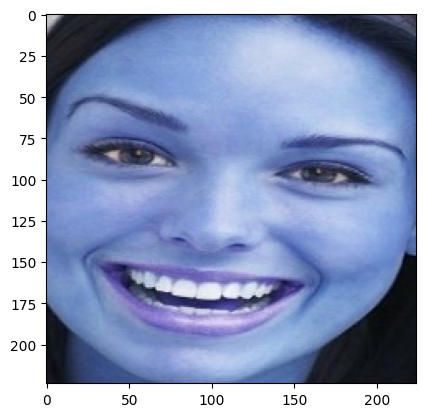

In [ ]:
plt.imshow(img)

In [ ]:
patches=tf.reshape(patches,(patches.shape[0],-1,768))
patches

<tf.Tensor: shape=(1, 256, 768), dtype=uint8, numpy=
array([[[189, 195, 194, ...,  32,  35,  40],
        [ 27,  30,  35, ...,  31,  34,  42],
        [ 37,  42,  45, ...,  22,  33,  54],
        ...,
        [ 25,  28,  33, ...,  17,  20,  25],
        [ 15,  18,  23, ...,  19,  21,  31],
        [ 18,  21,  26, ...,  18,  21,  26]]], dtype=uint8)>

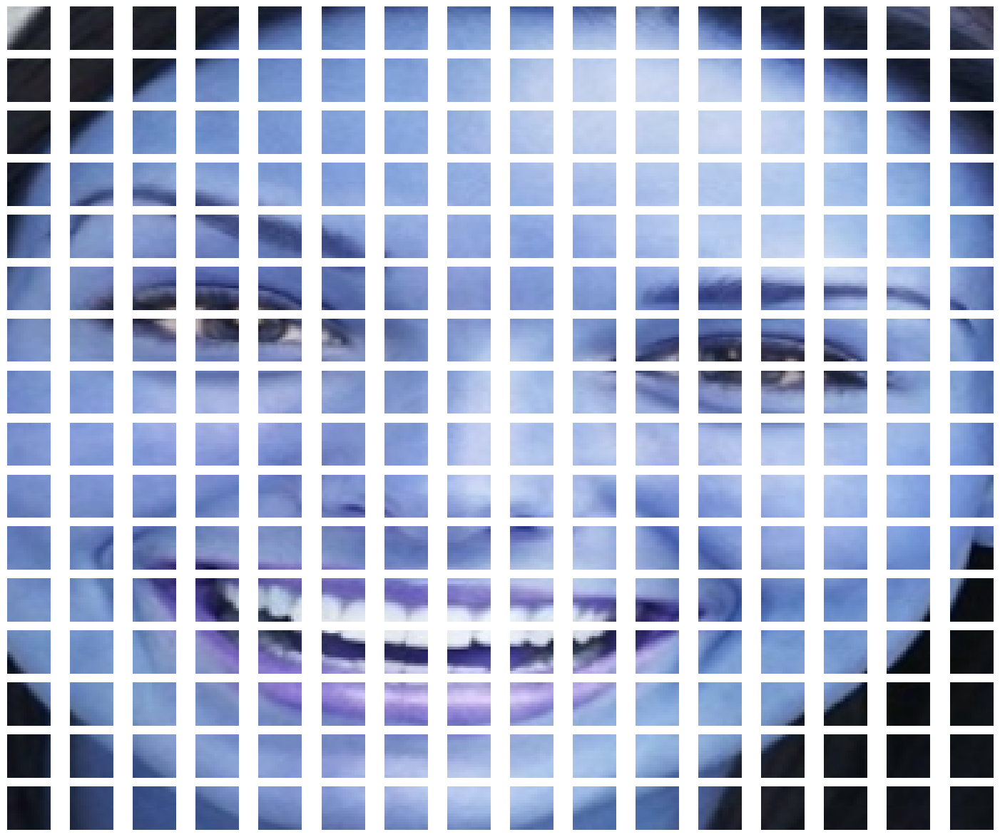

In [ ]:

plt.figure(figsize=(18,15))
for i in range(patches.shape[1]):
  plt.subplot(16,16,i+1)
  plt.imshow(tf.reshape(patches[0,i,:],(16,16,3)))
  plt.axis("off")

In [ ]:
pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 20.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.5/289.5 kB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.8 MB/s eta 0:00:00


Transformers
# **`bold text`**


In [ ]:
# prompt: wandb login

!wandb login


wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
Aborted!


In [ ]:
wandb login

SyntaxError: invalid syntax (<ipython-input-6-bbebb0a3802e>, line 1)

In [ ]:
def PatchEncoder(self,n_patches,hidden_size):
  super(PatchEncoder,self).__init__(name="patch_encoder")
  self.n_patches=n_patches
  self.hidden_size=hidden_size
  self.projection=tf.keras.layers.Dense(hidden_size)
  self.position_embedding=tf.keras.layers.Embedding(n_patches,hidden_size)
  self.supports_masking=True

  def call(self,x):
    patches=tf.image.extract_patches(
        images=x,
        sizes=[1,16,16,1],
        strides=[1,16,16,1],
        rates=[1,1,1,1],
        padding="VALID"
    )
    self.patches=self.ptches.reshape(patches.shape[0],256,patches.shape[0])
    encoded_patches=self.projection(patches)
    encoded_patches=encoded_patches+self.position_embedding(tf.range(0,self.n_patches,1))
    return encoded_patches



In [ ]:
# prompt: import PatchEncoder

import tensorflow as tf
import tensorflow_hub as hub

class PatchEncoder(tf.keras.Model):
  def __init__(self, num_patches, projection_dim, **kwargs):
    super().__init__(**kwargs)
    self.num_patches = num_patches
    self.projection = tf.keras.layers.Dense(units=projection_dim)
    self.position_embedding = tf.keras.layers.Embedding(
        input_dim=num_patches, output_dim=projection_dim)

  def call(self, patches):
    encoded_patches = self.projection(patches)
    encoded_patches = encoded_patches + self.position_embedding(tf.range(start=0, limit=self.num_patches, delta=1))
    return encoded_patches



In [ ]:
class VIT(Model):
  def __init__(self,N_HEADS,HIDDEN_SIZE,N_PATCHES,N_LAYERS,N_DENSE_UNITS):
    super(VIT,self).__init__(name="vision_transformer")
    self.N_Layers=N_LAYERS
    self.patch_encoder=PatchEncoder(N_Patches,HIDDEN_SIZE)
    self.trans_encoders=[TransformerEncoder(N_HEADS,HIDDEN_SIZE) for i in range(N_LAYERS)]
    self.dense_1=Dense(N_DENSE_UNITS,tf.nn.gelu)
    self.dense_2=Dense(N_DENSE_UNITS,tf.nn.gelu)
    self.dense_3=Dense(3,activation="softmax")

  def call(self,input,training=True):
    x=self.patch_encoder(input)
    for i in range(self.N_Layers):
      x=self.trans_encoders[i](x)
    x=Flatten()(x)
    x=self.dense_1(x)
    x=self.dense_2(x)
    return self.dense_3(x)


In [ ]:
class ViT(Model):
  def __init__(self, N_HEADS, HIDDEN_SIZE, N_PATCHES, N_LAYERS, N_DENSE_UNITS):
    super(ViT, self).__init__(name = 'vision_transformer')
    self.N_LAYERS = N_LAYERS
    self.patch_encoder = PatchEncoder(N_PATCHES, HIDDEN_SIZE)
    self.trans_encoders = [TransformerEncoder(N_HEADS, HIDDEN_SIZE) for _ in range(N_LAYERS)]
    self.dense_1 = Dense(N_DENSE_UNITS, tf.nn.gelu)
    self.dense_2 = Dense(N_DENSE_UNITS, tf.nn.gelu)
    self.dense_3 = Dense(CONFIGURATION["NUM_CLASSES"], activation = 'softmax')
  def call(self, input, training = True):

    x = self.patch_encoder(input)

    for i in range(self.N_LAYERS):
      x = self.trans_encoders[i](x)
    x = Flatten()(x)
    x = self.dense_1(x)
    x = self.dense_2(x)

    return self.dense_3(x)

In [ ]:
sh=patches.shape
print(sh)
patches=tf.reshape(sh[0],-1,sh[-1])
patches.shape

In [ ]:
class TransFormerEncoder(tf.keras.layers.Layer):
  def __init__(self,n_head,hidden_size):
    super(TransFormerEncoder,self).__init__("tr_encode")
    self.norm1=tf.keras.layers.LayerNormalization()
    self.norm2=tf.keras.layer.LayerNormalization()
    self.multi_head_att=tf.keras.layer.MultiHeadAttention(n_head,hidden_size)
    self.dense_1=tf.keras.layers.Dense(hidden_size,activation=tf.nn.gelu)
    self.dense_2=tf.keras.layers.Dense(hidden_size,activation=tf.nn.gelu)

  def call(self,input):
    x1=self.norm1(input)
    x1=self.multi_head_att(x1,x1)
    x1=tf.keras.layers.Add()[(x1,input)]
    x2=self.norm2(x1)
    x2=self.dense_1(x2)
    x2=self.dense_2(x2)
    x2=tf.keras.layers.Add()[(x2,input)]
    return x2

In [ ]:
def Vit(Model):
  def __init__(self,n_heads,hidden_size,n_patches,n_layers,n_dense_units):
    super(Vit,self).__init__("vit")
    self.patch_encoder=PatchEncoder(n_patches,hidden_size)
    self.trans_encoders=[TransFormerEncoder(n_heads,hidden_size) for _ in range(n_layers)]
    self.dense1=tf.keras.layers.Dense(n_dense_units,tf.nn.gelu)
    self.dense2=tf.keras.layers.Dense(n_dense_units,tf.nn.gelu)
    self.dense3=tf.keras.layers.Dense(3,activation="softmax")


  def call(self,x):
    x=self.patch_encoder(x)
    for i in range(self.n_layers):
      x=self.trans_encoders[i](x)
    x=tf.keras.layers.Flatten()(x)
    x=self.dense1(x)
    x=self.dense2(x)
    return self.dense3(x)












In [ ]:
class ViT(Model):
  def __init__(self, N_HEADS, HIDDEN_SIZE, N_PATCHES, N_LAYERS, N_DENSE_UNITS):
    super(ViT, self).__init__(name = 'vision_transformer')
    self.N_LAYERS = N_LAYERS
    self.patch_encoder = PatchEncoder(N_PATCHES, HIDDEN_SIZE)
    self.trans_encoders = [TransFormerEncoder(N_HEADS, HIDDEN_SIZE) for _ in range(N_LAYERS)]
    self.dense_1 = Dense(N_DENSE_UNITS, tf.nn.gelu)
    self.dense_2 = Dense(N_DENSE_UNITS, tf.nn.gelu)
    self.dense_3 = Dense(3, activation = 'softmax')
  def call(self, input, training = True):

    x = self.patch_encoder(input)

    for i in range(self.N_LAYERS):
      x = self.trans_encoders[i](x)
    x = Flatten()(x)
    x = self.dense_1(x)
    x = self.dense_2(x)

    return self.dense_3(x)

In [ ]:
vit = ViT(
    N_HEADS = 4, HIDDEN_SIZE = 768, N_PATCHES = 256,
    N_LAYERS = 2, N_DENSE_UNITS = 128)
vit(tf.zeros([2,256,256,3]))


TypeError: PatchEncoder() missing 1 required positional argument: 'hidden_size'

In [ ]:
!pip install transformers

In [ ]:
from transformers import ViTFeatureExtractor, TFViTModel

base_model=TFViTModel.from_pretrained("google/vit-base-patch16-224")
base_model.summary()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFViTModel: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initializing TFViTModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFViTModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFViTModel were not initialized from the PyTorch model and are newly initialized: ['vit.pooler.dense.weight', 'vit.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model: "tf_vi_t_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vit (TFViTMainLayer)        multiple                  86389248  
                                                                 
Total params: 86389248 (329.55 MB)
Trainable params: 86389248 (329.55 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
def bce():
  def loss(y_true,y_pred):
    return tf.keras.losses.binary_crossentropy(y_true,y_pred)
  return loss